# Capstone Project: The Battle of Neighborhoods
# New Coffee Shop Location Analysis in London, UK
#### Created by: Nur Agus Permadi Anwar
#### Email: bagus.permadi@yandex.com

In [1]:
#the following codes add a nice image of London for the project notebook:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://wallpapercave.com/wp/PuwoAuJ.jpg")

__[Opening Note]__

__I attached screenshots of the cloropleth maps because they won't be displayed correctly in github unless if you 'trust' the notebook.__


___This project will be divided into 5 major segments:___
1. Introduction: I will explain the rationale why I chose the specific topic for this project,
2. Methodology: In general, I will describe about the steps performed to work and analyze the data,
3. Discussion: This is the main part where I elaborate further about the analysis findings,
4. Conclusion: I try to summarize all of the main points of the analysis and how it help to solve the problem.
5. References

# 1. Introduction

## 1.1 Overview

The United Kingdom (UK) is traditionally known as a tea-drinking nation. But, in 2018, the had UK became the fourth-largest coffee market in Europe (EU28 countries) after Germany, France, and Italy, based on market size with an annual consumption value worth 1.9 billion euros. This value was translated into a total coffee consumption volume of around 74.600 tonnes (1). In terms of coffee consumption per capita however, the UK's number is only stood at 1.09 kilogram (kg), which was ranked far below Finland, the Europe's country with the highest per capita coffee consumption at 8.54 kg. This fact tells us about the UK coffee market relative upside potential in comparison with other European markets. The increasing coffee consumption as part of modern urban lifestyle, especially in major cities has been contributed heavily to this trend.

London is the capital and largest metropolis city of England and the UK. The city is divided into 33 districts which consist of 32 boroughs and the City of London Corporation (2). Currently there are more than 9 million people who live in London. The city has a population density of approximately 5,900 people per square km (3). London is also an attractive city for businesses and investors to make investment in a consumer-oriented food and beverages service businesses, such as coffee shop. Why so? Because first of all, London is one of the top financial centres and business hubs in Europe and the UK that housed many headquarters of major global corporations. Due to these characteristics, there are a large number of people working in the city that can be accessed as potential customers for business. Second, the city also has an investor friendly regulatory framework and tax regime, in addition to business property market that is geared to the investor. All of which provides the reasons to choose the city as investment destination for business. 

I made this analysis primarily with the perspective of investors who are interested to open a coffee shop in London. It is very important to consider the ideal location to establish the future coffee shop. This project will start with simple analysis such as determining which boroughs have the most attractive features and parameters that can help the decision-making process to select the location candidate. The primary target market for the coffee shop will be offices employees and government workers, in addition to the local population and tourists. To help answering these questions, I will perform analysis which include the creation of tables, maps, charts, and cluster analysis with K-nearest neighborhood (including the cluster evaluations).

## 1.2 Problem Statement

I narrowed down the main problem as follows:
- __Where is the most potential location to open a coffee shop in London?__

## 1.3 Data Description & How It Will Be Used

To support the analysis, I used data from the following sources:
- I obtained the postal code and the information of London boroughs from Chris Bell's website that is covering UK postcodes, map tools and some bits of code (4),
- The London Datastore by the Greater London Authority or GLA (3): GLA data are the main source data for this analysis. Data such as information on boroughs, population data, income, workday population, and information on London businesses.
- I used the geo spatial data in the format of JSON file format to draw the boundaries in the choropleth maps. I downloaded the files from Stuart Grange (5) and Martin Chorley (6) websites.
- Nominatim API from Python's GeoPy is used to obtain the coordinates of London (7).
- Foursquare API is used to show the location of venues in London based on the coordinates and to calculate the number of coffee shops in London. The data from the API is used further in the analysis and in the creation of choropleth maps to visualize the data (8). 

# 2. Methodology

## 2.1 Data Sources & Collection
The analysis used three main datas as follows: 
1. "daytime_population.csv" as the second dataset,
2. "business_Data.csv" as the third dataset,
3. "london-postal-codes.csv" as the first dataset,

I downloaded all of the above files separately, and keep them in my local hard-drive. I renamed all them to make it shorter and easier to import to Pandas' data frame. The reason I did it this way was because I was having difficulty to read the data directly from the website using Pandas'<code>read_csv()</code>. The original links to all of the three files are below:

[1. daytime_population.csv](https://data.london.gov.uk/dataset/daytime-population-borough)\
[2. business_Data.csv](https://data.london.gov.uk/download/london-borough-profiles/c1693b82-68b1-44ee-beb2-3decf17dc1f8/london-borough-profiles.csv)\
[3. london-postal-codes.csv](https://www.doogal.co.uk/UKPostcodesCSV.ashx?area=London)


## 2.2 Data Cleaning & Feature Selection
After all files are downloaded, each file will be check separately for the encoding method in order to avoid error when loading them to the Pandas' data frame. There are analysis that employed a combination of datasets to create bar charts and to provide information for the choropleth maps. 

The data cleaning process began by inspecting the data frame manually and using the <code>head()</code>, <code>shape</code>,and<code>info()</code> method. The column headers were inspected next. I removed the leading and trailing white spaces from the column headers, replaced the 'in-between' spaces with underscores, and renamed certain headers. The process was continued by selecting only the necessary columns to be used in the analysis, and to remove all the redundant and problematic features (columns).

Each dataset is mostly grouped based on borogh or neighborhood (ward). Columns with numbers are formatted to float or int data types, exception was made when necessary. The index numbers were mostly reset to streamline the alphabetical order of the boroughs, and in certain data frame to to reflect the applied sorting method. This grouping made all the three datasets and the new data frames created from them are all somewhat resemble one another. The process are done mostly by using <code>groupby()</code> method. The steps performed are more or less the same to clean the data, and are replicated all datasets.

#### Import Python Libraries for Data Frame Analysis:

In [2]:
import pandas as pd
import numpy as np

#### Dataset 1

The focus of the work in dataset 1 is to create a data frame that consist of features as follows: borough names, the number of workday populations in each borough, both including and excluding tourist. Since the main target consumers of the coffee shop are office employees in addition to the local population and tourist, the data of workday population for each borough becomes very important. After a data frame that consist of workday populations is created, it will be processed further in the initial analysis steps later on to provide information for the construction of bar chart and choropleth map in order to visualize which borough or area that has the most workday population.

In [3]:
#check the file encoding first:
with open('daytime_population.csv') as f:
    print(f.encoding)

cp1252


In [4]:
#read the file and load it to a new data frame:
df1 = pd.read_csv('daytime_population.csv', encoding='cp1252', sep=';')
df1.columns = ['Borough','Workday_population_include_tourists','Workday_population_exclude_tourists']
df1.head()

,Borough,Workday_population_include_tourists,Workday_population_exclude_tourists
0,City of London,553103,431384
1,Barking and Dagenham,178326,164584
2,Barnet,356003,331094
3,Bexley,211551,194807
4,Brent,293859,274896


In [5]:
#clear the unnecessary whitespaces and replace in-between spaces with underscores:
df1.columns = df1.columns.str.strip()
df1.columns = df1.columns.str.replace(' ','_')

In [6]:
#check the number of rows and columns:
df1.shape

(33, 3)

In [7]:
#check the null content and the data types of each columns:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 3 columns):
 #   Column                               Non-Null Count  Dtype 
---  ------                               --------------  ----- 
 0   Borough                              33 non-null     object
 1   Workday_population_include_tourists  33 non-null     int64 
 2   Workday_population_exclude_tourists  33 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 920.0+ bytes


#### Dataset 2

The focus of the work in dataset 2 is to create a data frame that consist of features as follows: the number of active business, and the two year business survival rates. The data on the number of active business is important, as it supplemented our knowledge about the number of workday populations per borough. The second data frame will give a better picture to understand which area has the most potential in terms of the coffee shop's potential target market. 

The two-year business survival rates is included because initially, I wanted to see which areas have the lowest survival rates. However after further inspection, the rates across the boroughs are not significantly different from one another. This particular data however, might change in the future, which can inform us about the changing business in each of the London's borough.

In [8]:
#check the file encoding first:
with open('business_data.csv') as f:
    print(f.encoding)

cp1252


In [9]:
#read the file and load it to a new data frame:
df2 = pd.read_csv('business_data.csv', encoding='cp1252', sep=';')
df2.columns = ['Borough','Number_of_active_business','Two_year_business_survival_rates']
df2.head()

,Borough,Number_of_active_business,Two_year_business_survival_rates
0,City of London,26130,64
1,Barking and Dagenham,6560,73
2,Barnet,26190,74
3,Bexley,9075,74
4,Brent,15745,74


In [10]:
#clear the unnecessary whitespaces and replace in-between spaces with underscores:
df2.columns = df2.columns.str.strip()
df2.columns = df2.columns.str.replace(' ','_')

In [11]:
#check the number of rows and columns:
df2.shape

(33, 3)

In [12]:
#check the null content and the data types of each columns:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 3 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   Borough                           33 non-null     object
 1   Number_of_active_business         33 non-null     int64 
 2   Two_year_business_survival_rates  33 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 920.0+ bytes


#### Dataset 3

The focus of the work in dataset 3 pre-processing was to create a data frame that consist of features as follows: borough names, ward (will be rename to 'neighborhood), average annual income per borough (total in GBP), and geo location data in the forms of latitude and longitude data. The process was simply done using Pandas library. The primary reason for this analysis was to see which borough has the most average income. This information when combine with other data such as the number of workday population, is one of the important decision-making factors  which borough the investor should establish the coffee shop.

In [13]:
#check the file encoding first:
with open("london_postal_codes.csv") as f:
    print(f.encoding)

cp1252


In [14]:
#read the file and load it to a new data frame:
dfsrc3 = pd.read_csv('london_postal_codes.csv', encoding='cp1252')
dfsrc3.head()

C:\Users\pythonnarrowjim\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (47) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,Postcode,In Use?,Latitude,Longitude,Easting,Northing,Grid Ref,County,District,Ward,...,Nearest station,Distance to station,Postcode area,Postcode district,Police force,Water company,Plus Code,Average Income,Sewage Company,Travel To Work Area
0,BR1 1AA,Yes,51.401546,0.015415,540291,168873,TQ402688,Greater London,Bromley,Bromley Town,...,Bromley South,0.218257,BR,BR1,Metropolitan Police,Thames Water,9F32C228+J5,63100,NaN,London
1,BR1 1AB,Yes,51.406333,0.015208,540262,169405,TQ402694,Greater London,Bromley,Bromley Town,...,Bromley North,0.253666,BR,BR1,Metropolitan Police,Thames Water,9F32C248+G3,56100,NaN,London
2,BR1 1AD,No,51.400057,0.016715,540386,168710,TQ403687,Greater London,Bromley,Bromley Town,...,Bromley South,0.044559,BR,BR1,Metropolitan Police,NaN,9F32C228+2M,63100,NaN,London
3,BR1 1AE,Yes,51.404543,0.014195,540197,169204,TQ401692,Greater London,Bromley,Bromley Town,...,Bromley North,0.462939,BR,BR1,Metropolitan Police,Thames Water,9F32C237+RM,63100,NaN,London
4,BR1 1AF,Yes,51.401392,0.014948,540259,168855,TQ402688,Greater London,Bromley,Bromley Town,...,Bromley South,0.227664,BR,BR1,Metropolitan Police,Thames Water,9F32C227+HX,63100,NaN,London


In [15]:
#check the number of rows and columns:
dfsrc3.shape

(323306, 49)

In [16]:
#check the null content and the data types of each columns:
dfsrc3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 323306 entries, 0 to 323305
Data columns (total 49 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Postcode                        323306 non-null  object 
 1   In Use?                         323306 non-null  object 
 2   Latitude                        323306 non-null  float64
 3   Longitude                       323306 non-null  float64
 4   Easting                         323306 non-null  int64  
 5   Northing                        323306 non-null  int64  
 6   Grid Ref                        323306 non-null  object 
 7   County                          323306 non-null  object 
 8   District                        323306 non-null  object 
 9   Ward                            323306 non-null  object 
 10  District Code                   323306 non-null  object 
 11  Ward Code                       323306 non-null  object 
 12  Country         

In [17]:
#clear the unnecessary whitespaces and replace in-between spaces with underscores:
dfsrc3.columns = dfsrc3.columns.str.strip()
dfsrc3.columns = dfsrc3.columns.str.replace(' ','_')

In [18]:
#select the necessary columns for analysis, rename the column headers, then check the data frame: 
dfsrc3 = dfsrc3[['District','Ward','Average_Income','Latitude','Longitude']]
dfsrc3.rename(columns={'District':'Borough', 'Ward':'Neighborhood','Average_Income':'Avg_Income'},inplace=True)
dfsrc3.head()

,Borough,Neighborhood,Avg_Income,Latitude,Longitude
0,Bromley,Bromley Town,63100,51.401546,0.015415
1,Bromley,Bromley Town,56100,51.406333,0.015208
2,Bromley,Bromley Town,63100,51.400057,0.016715
3,Bromley,Bromley Town,63100,51.404543,0.014195
4,Bromley,Bromley Town,63100,51.401392,0.014948


#### Note: Dataset 3

- I created a separated data frame ('df3_sort') to provide the basis of the first two choropleth maps creation.
- I tried to obtain the unique names of all the neighborhoods and grouped them all based on their own respective borough.
- I added the column 'Average Income' initially to be used in the analysis. But later on I found out that there were other factors that weigh more on decision about location.

In [19]:
#Create a grouped & sorted data frame for the initial choropleth map:
df1x = dfsrc3.groupby(['Borough'])['Neighborhood'].unique().apply(', '.join).reset_index()
df2x = dfsrc3.groupby(['Borough'])['Avg_Income','Latitude','Longitude'].mean().reset_index()
df2x['Avg_Income']=df2x['Avg_Income'].apply('{:,.2f}'.format)
df3_sort = pd.merge(df1x, df2x, on = ['Borough'], how = "inner") 
df3_sort.head()

<ipython-input-19-8771337d7d22>:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df2x = dfsrc3.groupby(['Borough'])['Avg_Income','Latitude','Longitude'].mean().reset_index()


,Borough,Neighborhood,Avg_Income,Latitude,Longitude
0,Barking and Dagenham,"Thames, Gascoigne, Eastbury, Abbey, Longbridge...","42,599.87",51.546453,0.124953
1,Barnet,"Oakleigh, High Barnet, East Barnet, Brunswick ...","55,496.79",51.605511,-0.207739
2,Bexley,"Crayford, Barnehurst, Sidcup, Blackfen & Lamor...","50,447.16",51.459192,0.136353
3,Brent,"Alperton, Sudbury, Wembley Central, Northwick ...","47,918.76",51.551772,-0.257489
4,Bromley,"Bromley Town, Shortlands, Bickley, Plaistow an...","57,706.21",51.391808,0.026273


## 2.3 Initial Analysis

__Purpose of the Initial Analysis:__

The purpose of the initial analysis is to find the best location to establish a coffee shop in London. I will use two main criteria to determine which location has the most potential. Those data are 'the number of workday populations', and 'the number of active businesses'. These two data I believe will be representative enough to gauge the number of potential customers for the coffee shop. As previously mentioned, the coffee shop is planned to target employees, government workers, as well as the local population and tourists. 

I began the initial analysis by importing the necessary Python libraries for geo data, creating API connection, image display, and map visualization. Then, I proceed to obtain London's geographical coordinates (latitude and longitude data) using geopy. These coordinates will be used to display the map of London.

Once the location candidate is chosen, I will then use the Foursquare API to see the competitive landscape in that particular location (neighborhood/ward). I will pay attention to the number of coffee shops in the area, as well as the number of cafe. Cafe is a close substitute for coffee shop, but cafes are mostly focusing more on their food menus, while coffee shop focuses more on their beverage menus (particularly coffee!).

#### Import the libraries

In [20]:
%matplotlib inline 
import matplotlib as mpl
import matplotlib.pyplot as plt

import requests
import random 

!pip install geopy
from geopy.geocoders import Nominatim

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 
    
# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize

# library for map visualization
! pip install folium==0.5.0
import folium # plotting library

#### Use the geopy nominatim API to obtain London's coordinates

In [21]:
#Foursquare use the term 'Neighborhood' instead of ward!
address = 'London, UK'

geolocator = Nominatim(user_agent="london_explorer")
location = geolocator.geocode(address)
lat = location.latitude
lng = location.longitude
print('The geograpical coordinates of London are {}, {}.'.format(lat, lng))

The geograpical coordinates of London are 51.5073219, -0.1276474.


### 2.3.1 Find Borough with the Highest Number of Workday Population

- I sorted the dataset 1 ('df1') using <code>sort_values()</code> in descending order based on the workday population number (include tourists) in order to see which borough has the greatest number of potential customers for the coffee shop.
- The difference in the result is significant. We can see that even in the top 10 rank, Westminster topped other boroughs in both numbers (with or without tourists) with quite considerable gaps.
- If we had to make decision based on this data alone, we can confidently say that Westminster is the perfect location for the future coffee shop to access the large number of potential customers. However, we need to check for other data.
- Next, I created a bar chart using the matplot library <code>plot()</code> function to visualize the number of workday population in the top 10 boroughs. We can see how the bar that represents Westminster stood tall compares to others.

#### Table 1: Top 10 Boroughs based on Workday Population

In [22]:
df11 = df1.sort_values(by='Workday_population_include_tourists', ascending=False)
df11.reset_index(inplace = True) 
df11.drop(index=df1.iloc[10:, :].index.tolist(), inplace=True)
df11.drop(['index'], axis=1, inplace=True)
df11

,Borough,Workday_population_include_tourists,Workday_population_exclude_tourists
0,Westminster,897293,721351
1,City of London,553103,431384
2,Camden,495332,434279
3,Southwark,417029,382582
4,Tower Hamlets,396939,367677
5,Hillingdon,357295,327032
6,Barnet,356003,331094
7,Croydon,349228,314819
8,Islington,328050,297460
9,Ealing,327625,305316


#### Bar Chart 1: Top 10 Boroughs based on Workday Population

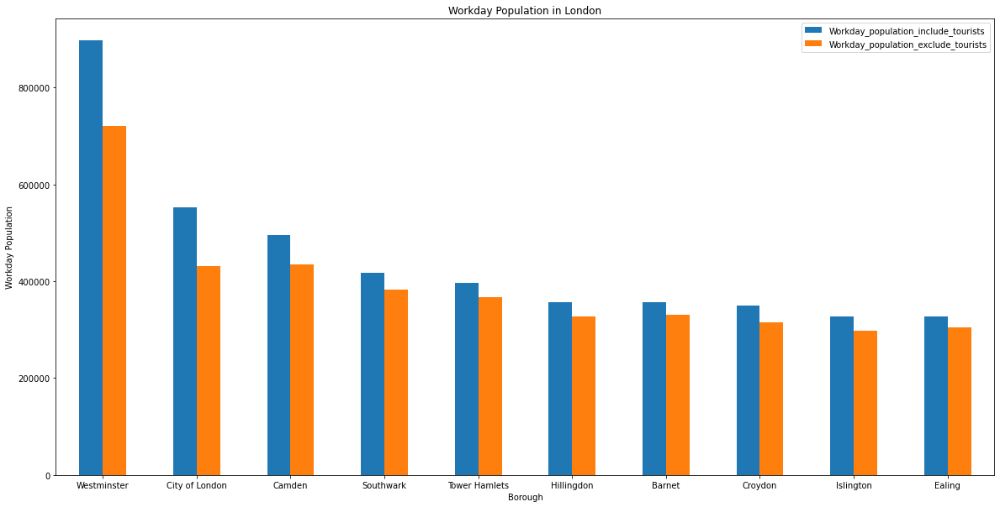

In [23]:
df11.plot(kind='bar', stacked=False, x="Borough", y=["Workday_population_include_tourists","Workday_population_exclude_tourists"], figsize=(20, 10))
plt.title('Workday Population in London')
plt.ylabel('Workday Population')
plt.xlabel('Borough')
plt.xticks(rotation=0)
plt.show()

#### Choropleth Map 1: London Borough, based on Workday Population (include Tourists)
- I created a choropleth map using <code>Folium</code> library that shows the color intensity in London borough based on the number of workday population (include tourists),
- I also superimposed the clusters on the map to provide information on the name of each borough,
- In this choropleth map, we can see the color of Westminster is in dark red. It signifies the biggest number of workday population relative to other boroughs. It confirms what the chart shows, but for all boroughs in London.

#### Note: Create a data frame to support the choropleth map 1

The main difference of this new data frame compare to the previous one used to construct the bar chart is this data frame is merged with the dataset 3 in order to show the coordinates (latitude and longitude) of each borough. The purpose is to enable the choropleth to show the color intensity of each borough based on the number of workday population. The meaning of each different gradient of colors are explained in the legend on the top right corner of the map.

The markers and that are added to the map also shows different marker size for each burough based on the number of workday population. The label marker displays the actual number of workday population.

In [24]:
df12 = df1.sort_values(by='Workday_population_include_tourists', ascending=False)
df12.reset_index(inplace = True) 
df12_3 = pd.merge(df3_sort, df12, on = ['Borough'], how = "inner") 
df12_3.head()

,Borough,Neighborhood,Avg_Income,Latitude,Longitude,index,Workday_population_include_tourists,Workday_population_exclude_tourists
0,Barking and Dagenham,"Thames, Gascoigne, Eastbury, Abbey, Longbridge...","42,599.87",51.546453,0.124953,1,178326,164584
1,Barnet,"Oakleigh, High Barnet, East Barnet, Brunswick ...","55,496.79",51.605511,-0.207739,2,356003,331094
2,Bexley,"Crayford, Barnehurst, Sidcup, Blackfen & Lamor...","50,447.16",51.459192,0.136353,3,211551,194807
3,Brent,"Alperton, Sudbury, Wembley Central, Northwick ...","47,918.76",51.551772,-0.257489,4,293859,274896
4,Bromley,"Bromley Town, Shortlands, Bickley, Plaistow an...","57,706.21",51.391808,0.026273,5,303344,271896


In [25]:
london_geo = 'london_boroughs.json' # geojson file

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# create map
map_clusters = folium.Map(location=[lat, lng], zoom_start=10)


# generate choropleth map using the Workday_population_include_tourists for london
map_clusters.choropleth(
    geo_data=london_geo,
    data=df12_3,
    columns=['Borough', 'Workday_population_include_tourists'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.5, 
    line_opacity=0.6,
    legend_name='Workday_population_include_tourists in London'
)
folium.LayerControl().add_to(map_clusters)

# add markers to map
for lat, lng, borough, neighborhood, pop in zip(df12_3['Latitude'],df12_3['Longitude'], 
                                           df12_3['Borough'], 
                                           df12_3['Neighborhood'],
                                           df12_3['Workday_population_include_tourists']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup('Borough Name: ' + str(borough) + ' | Workday Population: ' + str(pop) , parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=pop/50000,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_clusters)  

    
# display map
map_clusters

#### Screenshot of the Choropleth Map 1

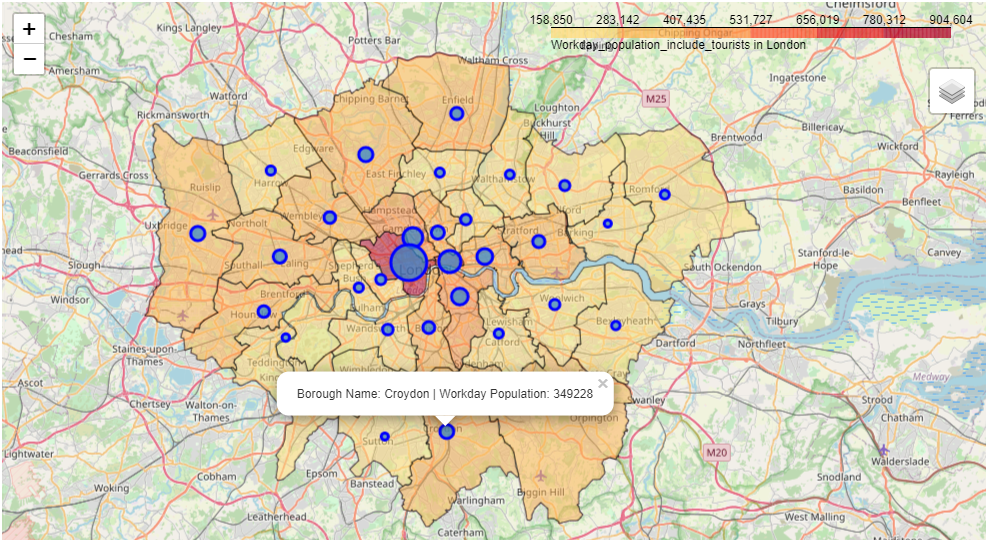

### 2.3.2 Find Borough with The Highest Number of Active Business 

- I sorted the dataset 2 ('df2') using <code>sort_values()</code> in descending order based on the number of active businesses in order to gauge the area potential to generate potential customers, that is the office employees as well as government workers for the coffee shop.
- The result shows the same outcome to the previous analysis. Westminster remains at the top. Westminster has a considerably larger number of active businesses compare to any other boroughs, which means this area is presumably have a higher number of workers and employees.
- Similar to the previous analysis, if we had to make decision based on this data alone, Westminster is the clear winner.
- On to the next step, I created two bar charts using the matplot library <code>plot()</code> function to visualize the number of active businesses in the top 10 boroughs and the two year business survival rates. The first bar chart confirms the findings in the table 2.

#### Table 2: Top 10 Boroughs based on Active Businesses

In [26]:
df21 = df2.sort_values(by='Number_of_active_business', ascending=False)
df21.reset_index(inplace = True) 
df21.drop(index=df2.iloc[10:, :].index.tolist(), inplace=True)
df21.drop(['index'], axis=1, inplace=True)
df21

,Borough,Number_of_active_business,Two_year_business_survival_rates
0,Westminster,55385,69
1,Camden,31385,74
2,Barnet,26190,74
3,City of London,26130,64
4,Islington,22110,73
5,Ealing,18700,76
6,Wandsworth,18695,76
7,Hackney,18510,77
8,Tower Hamlets,18390,70
9,Lambeth,17280,64


#### Bar Chart 2: Top 10 Boroughs based Active Business

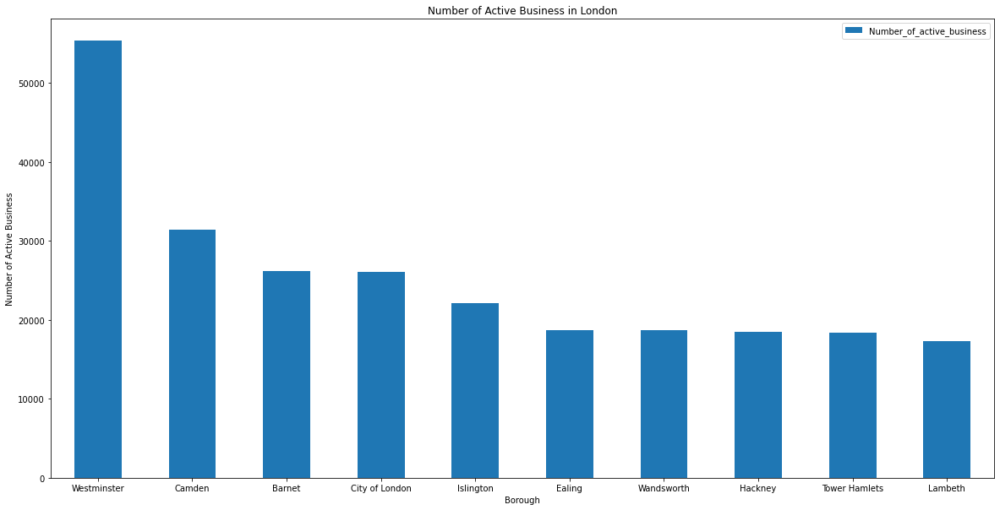

In [27]:
df21.plot(kind='bar', stacked=False, x="Borough", y="Number_of_active_business",figsize=(20, 10))
plt.title('Number of Active Business in London')
plt.ylabel('Number of Active Business')
plt.xlabel('Borough')
plt.xticks(rotation=0)
plt.show()

#### Bar Chart 3: Top 10 Boroughs based on Business Survival Rate

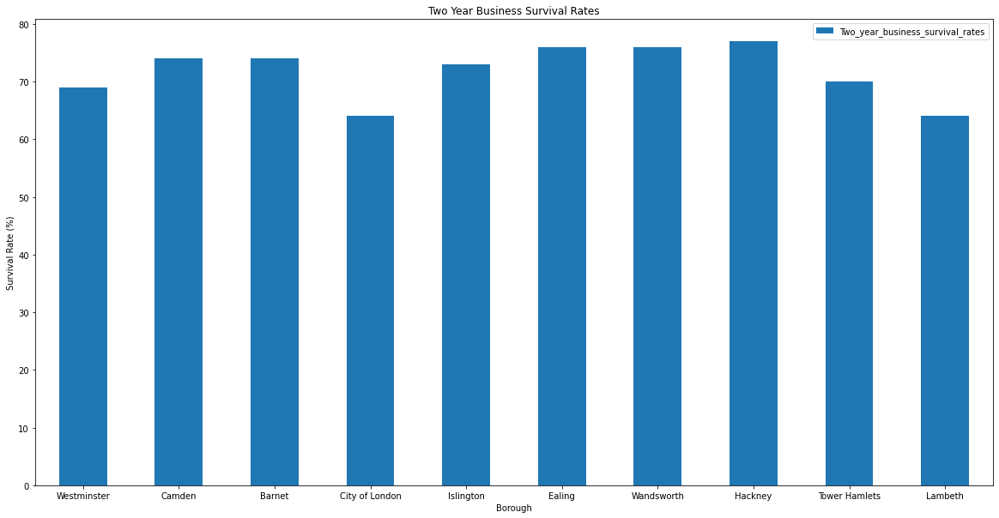

In [28]:
df21.plot(kind='bar', stacked=False, x="Borough", y="Two_year_business_survival_rates",figsize=(20, 10))
plt.title('Two Year Business Survival Rates')
plt.ylabel('Survival Rate (%)')
plt.xlabel('Borough')
plt.xticks(rotation=0)
plt.show()

#### Choropleth Map 2: London Borough based on Number of Active Businesses

- Similar with the first choropleth map, I used <code>Folium</code> library to create a map that shows the color intensity in each borough based on the number of active businesses,
- I superimposed the clusters on the map to provide information on the name of each borough,
- Once again, the color of Westminster is in dark red because it has the highest number of active businesses compares to any other boroughs.

#### Note: Create a new data frame to support the choropleth map 2

As mentioned before in the 'Note: Create a data frame to support the choropleth map 1', this new data frame for choropleth map 2 is created with relatively the same processes. The difference is in the data that are used to create it. I merged the Table 2 data with the dataset 3 data frame to make the choropleth show the color intensity of each borough based on the number of active businesses.

In [29]:
df22 = df2.sort_values(by='Number_of_active_business', ascending=False)
df22.reset_index(inplace = True) 
df22_3 = pd.merge(df3_sort, df22, on = ['Borough'], how = "inner") 
df22_3.head()

,Borough,Neighborhood,Avg_Income,Latitude,Longitude,index,Number_of_active_business,Two_year_business_survival_rates
0,Barking and Dagenham,"Thames, Gascoigne, Eastbury, Abbey, Longbridge...","42,599.87",51.546453,0.124953,1,6560,73
1,Barnet,"Oakleigh, High Barnet, East Barnet, Brunswick ...","55,496.79",51.605511,-0.207739,2,26190,74
2,Bexley,"Crayford, Barnehurst, Sidcup, Blackfen & Lamor...","50,447.16",51.459192,0.136353,3,9075,74
3,Brent,"Alperton, Sudbury, Wembley Central, Northwick ...","47,918.76",51.551772,-0.257489,4,15745,74
4,Bromley,"Bromley Town, Shortlands, Bickley, Plaistow an...","57,706.21",51.391808,0.026273,5,15695,79


In [30]:
london_geo = 'london_boroughs.json' # geojson file

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# create map
map_clusters = folium.Map(location=[lat, lng], zoom_start=10)

    
# generate choropleth map using the Number of Active Businesses london
map_clusters.choropleth(
    geo_data=london_geo,
    data=df22_3,
    columns=['Borough', 'Number_of_active_business'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.5, 
    line_opacity=0.6,
    legend_name='Number of active businesses in London'
)

folium.LayerControl().add_to(map_clusters)

# add markers to map
for lat, lng, borough, neighborhood, active in zip(df22_3['Latitude'], df22_3['Longitude'], df22_3['Borough'], 
                                           df22_3['Neighborhood'],
                                        df22_3['Number_of_active_business']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup('Borough Name: ' + str(borough) + ' | Number of Active Businesses: ' + str(active) , parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=active/3000,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_clusters)  

# display map
map_clusters

#### Screenshot of the Choropleth Map 2: 

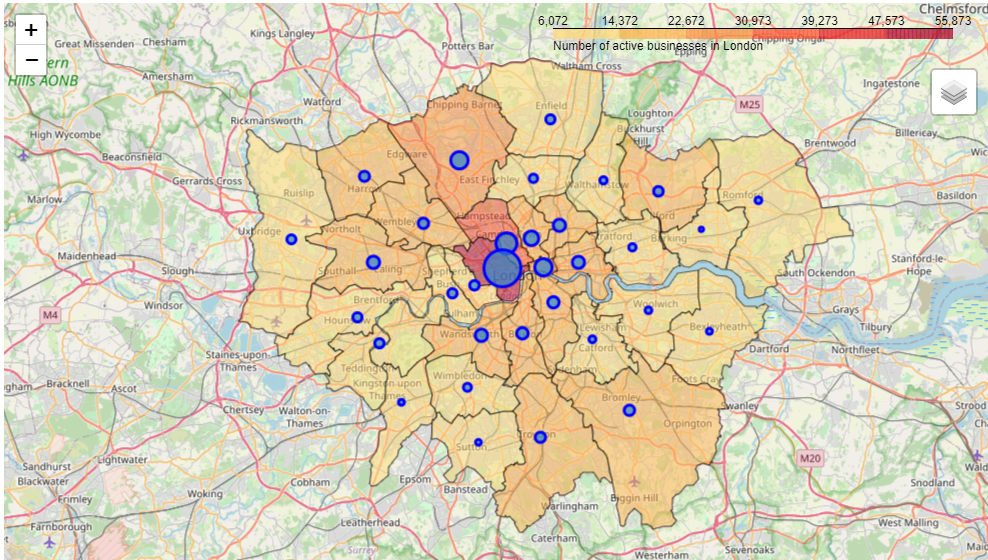

#### 2.3.3 Summary: Initial Analysis

The result from the two initial analysis have indicated that __Westminster__ is the ideal location to establish the coffee shop. The significant difference with other boroughs in terms of both workday population and number of active businesses becomes a very decisive factor. On the other hand, the level of average income and the two year survival rate were not chosen because they don't really seem to have the similar impact compare to the first two factors. __With this result, I decided to choose Westminster as the area candidate to establish the coffee shop.__ Next, I will explore the the neighborhoods in Westminster further and perform cluster analysis to determine the attractiveness of each neighborhood.

For the next step, I will create a new data frame specifically for Westminster data. I will group the data based on Westminster unique name of neighbourhood data, to avoid having to process more than 30,000 rows on location data. After the unique neighborhood data has beed generated, I drop the borough name. I did this to focus to the neighborhood data, and achieve the level of granularity that matched with Foursquare API data. The other reason was there is a limit to the number of data that can be called from Foursquare API with my free account. 

#### Create a new data frame for Westminster for further analysis

In [31]:
df3_west = dfsrc3.loc[dfsrc3['Borough'] == 'Westminster'].drop(['Borough'], axis=1)
df3_west = df3_west.groupby(['Neighborhood'])['Avg_Income','Latitude','Longitude'].mean().reset_index()
df3_west['Avg_Income']=df3_west['Avg_Income'].apply('{:,.2f}'.format)
df3_west

<ipython-input-31-15b1881bd72b>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df3_west = df3_west.groupby(['Neighborhood'])['Avg_Income','Latitude','Longitude'].mean().reset_index()


,Neighborhood,Avg_Income,Latitude,Longitude
0,Abbey Road,"58,576.86",51.534412,-0.178185
1,Bayswater,"56,673.68",51.516727,-0.191849
2,Bryanston and Dorset Square,"62,578.10",51.518843,-0.161807
3,Church Street,"39,800.00",51.523680,-0.169851
4,Churchill,"50,717.59",51.488757,-0.147685
5,Harrow Road,"47,554.90",51.526298,-0.197197
6,Hyde Park,"56,991.49",51.516236,-0.173652
7,Knightsbridge and Belgravia,"56,530.63",51.499373,-0.158983
8,Lancaster Gate,"60,712.74",51.512922,-0.185634
9,Little Venice,"57,785.78",51.523944,-0.180025


In [32]:
df3_west.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Neighborhood  20 non-null     object 
 1   Avg_Income    20 non-null     object 
 2   Latitude      20 non-null     float64
 3   Longitude     20 non-null     float64
dtypes: float64(2), object(2)
memory usage: 768.0+ bytes


## 2.4 Foursquare API: Create Connection & Data Retrieval

#### 2.4.1 Import the necessary libraries for connection and map visualization

To get the latitude and longitude data of Westminster, London, I used the geopy library, specifically the Nominatim API to convert an address into latitude and longitude values. The geo coordinates data then used to create a map of Westminster. I used python folium library to visualize geographic details of Westminster. 

#### 2.4.2 Find Westminster's latitude (lat) & longitude (lng) using geolocator

In [33]:
#Foursquare use the term 'Neighborhood' instead of ward!
address = 'Westminster, UK'

geolocator = Nominatim(user_agent="westminster_explorer")
location = geolocator.geocode(address)
lat = location.latitude
lng = location.longitude
print('The geograpical coordinate of Westminster are {}, {}.'.format(lat, lng))

The geograpical coordinate of Westminster are 51.5004439, -0.1265398.


#### 2.4.3 Define Foursquare API credentials and version

In [34]:
CLIENT_ID = 'OO1BEHY2H4UD4CRPAIWNPYZWFBZTDWTHMO0SPGOL4JDMXSES'
CLIENT_SECRET = 'ACQ3EUPI5IDNL5XEOIXS3E34FNDF0C1WYDJN5FQW5E15VXCL'
ACCESS_TOKEN = 'LQV0WXH0WLAQCKUEBEWNICBCTEV5HI4GQY0VHDZG43OSDKGX'
VERSION = '20180604'
LIMIT = 30
print('Your credentials:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentials:
CLIENT_ID: OO1BEHY2H4UD4CRPAIWNPYZWFBZTDWTHMO0SPGOL4JDMXSES
CLIENT_SECRET:ACQ3EUPI5IDNL5XEOIXS3E34FNDF0C1WYDJN5FQW5E15VXCL


#### 2.4.4 Create the connection link

In [35]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    lat, 
    lng, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=OO1BEHY2H4UD4CRPAIWNPYZWFBZTDWTHMO0SPGOL4JDMXSES&client_secret=ACQ3EUPI5IDNL5XEOIXS3E34FNDF0C1WYDJN5FQW5E15VXCL&v=20180604&ll=51.5004439,-0.1265398&radius=500&limit=100'

#### 2.4.5 Establish the connection to Foursquare API and return a json file

In [36]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '60232044051c9e661612b936'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Westminster',
  'headerFullLocation': 'Westminster, London',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 45,
  'suggestedBounds': {'ne': {'lat': 51.5049439045,
    'lng': -0.11932447370735436},
   'sw': {'lat': 51.4959438955, 'lng': -0.13375512629264566}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4ac518cef964a520f6a520e3',
       'name': 'Elizabeth Tower (Big Ben) (Big Ben (Elizabeth Tower))',
       'location': {'address': 'Parliament Sq',
        'crossStreet': 'Bridge St',
        'lat': 51.50062,
        'lng': -0.124578,
        'labeledL

# 3. Discussion

## 3.1 Transforming Foursquare API data to a Data Frame

The Foursquare API in the previous segment 2.4 is used to explore all the venues available in the neighborhoods of Westminster. The API connection has a limit of 100 venues per neighborhood. I define the 'search' radius to 500 meters for each neighborhood. The Foursquare API will provide the information of each venues in the neighborhood including their geo coordinates data (latitudes and longitudes).

A function called 'getNearbyVenues' is utilized to extract information about venues name and venues geo location from the json file returned from the API. I will then proceed to create a new data frame from the combination of the venues name and geo location with information on Westminster's neighborhood names and its respective geo coordinates (stored in another data frame 'df3_west'). I will name the newly created data frame as 'westminster_venues'.

#### 3.1.1 Create a function that extracts the category of the venue to all the boroughs in London

In [37]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name, lat, lng)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)
    

#### 3.1.2 Check all the Westminster's neighborhoods' coordinates

In [38]:
westminster_venues = getNearbyVenues(names=df3_west['Neighborhood'],
                                     latitudes=df3_west['Latitude'],
                                     longitudes=df3_west['Longitude'])

Abbey Road 51.53441166735539 -0.17818496694214908
Bayswater 51.516727065789475 -0.19184928289473727
Bryanston and Dorset Square 51.518842899427106 -0.16180695798854253
Church Street 51.52367955775579 -0.16985079537953796
Churchill 51.48875660912053 -0.14768505863192183
Harrow Road 51.52629806643361 -0.19719740909090794
Hyde Park 51.51623638981746 -0.17365155319149078
Knightsbridge and Belgravia 51.49937330223128 -0.1589830892494931
Lancaster Gate 51.512921545647444 -0.18563404033970263
Little Venice 51.523943620853046 -0.1800246919431279
Maida Vale 51.529772894736865 -0.18913151196172223
Marylebone High Street 51.51888670521391 -0.1505475596738328
Queen's Park 51.529627424000026 -0.20850375199999985
Regent's Park 51.529469318352255 -0.16870770037453248
St James's 51.507342662177855 -0.12869094826364233
Tachbrook 51.48855061454544 -0.13538239636363647
Vincent Square 51.49530294374955 -0.13600611015625233
Warwick 51.49235410544816 -0.14364576449912136
West End 51.51354353930015 -0.140732

#### 3.1.3 Check the size (number of rows) of the resulting dataframe

In [39]:
westminster_venues.value_counts(subset='Venue Category')

Venue Category
Hotel                 89
Café                  64
Coffee Shop           63
Pub                   49
Italian Restaurant    37
                      ..
Pilates Studio         1
Church                 1
Platform               1
Irish Pub              1
Gym Pool               1
Length: 193, dtype: int64

In [40]:
print(westminster_venues.shape)
westminster_venues.head()

(1169, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey Road,51.534412,-0.178185,Abbey Road Studios,51.532371,-0.177779,Recording Studio
1,Abbey Road,51.534412,-0.178185,Abbey Road Crossing,51.532063,-0.177268,Historic Site
2,Abbey Road,51.534412,-0.178185,Heartcore Pilates,51.535570,-0.175002,Gym / Fitness Center
3,Abbey Road,51.534412,-0.178185,Heartcore Fitness,51.535725,-0.174741,Pilates Studio
4,Abbey Road,51.534412,-0.178185,Abbey Road Shop,51.532311,-0.177740,Gift Shop


In [41]:
sum0 = westminster_venues['Venue'].count()
print('There are {} number of venues in Westminster.'.format(sum0))

There are 1169 number of venues in Westminster.


#### 3.1.4 Sort the neighborhoods based on the total number of venues & plot into a bar chart

In [42]:
total = westminster_venues
total_sort = total.drop(total.columns[[1,2,4,5]], axis = 1) 
total_sort['Counts'] = total_sort.groupby(['Neighborhood'])['Venue Category'].transform('count')
total_sort = total_sort.groupby(['Neighborhood','Counts'])['Venue'].unique().apply(', '.join).reset_index()
total_sort = total_sort.sort_values(by='Counts', ascending=False)
total_sort

,Neighborhood,Counts,Venue
17,Warwick,100,"Pimlico Fresh, FRAME, Artist Residence, Leon, ..."
18,West End,100,"Carnaby Street, Goodman Steakhouse, Dishoom, L..."
8,Lancaster Gate,99,"Boots, Halepi, Gold Mine, Amorino, Santorini T..."
1,Bayswater,97,"JOE & THE JUICE, LOKKANTA, GAIL's Bakery, Plan..."
2,Bryanston and Dorset Square,96,"Briciole, Dinings, The Z Hotel Gloucester Plac..."
16,Vincent Square,93,"Iris & June, Curzon Victoria, Strutton Ground ..."
6,Hyde Park,87,"Paramount Lebanese Kitchen, M&S Simply Food, F..."
11,Marylebone High Street,85,"Daunt Books, La Fromagerie, Le Relais de Venis..."
14,St James's,79,"National Gallery, Trafalgar Square, East Trafa..."
7,Knightsbridge and Belgravia,72,"Chanel Boutique, L'ETO Caffè, Jimmy Choo, Otto..."


#### Bar Chart 4: Number of Venues per Neighborhood

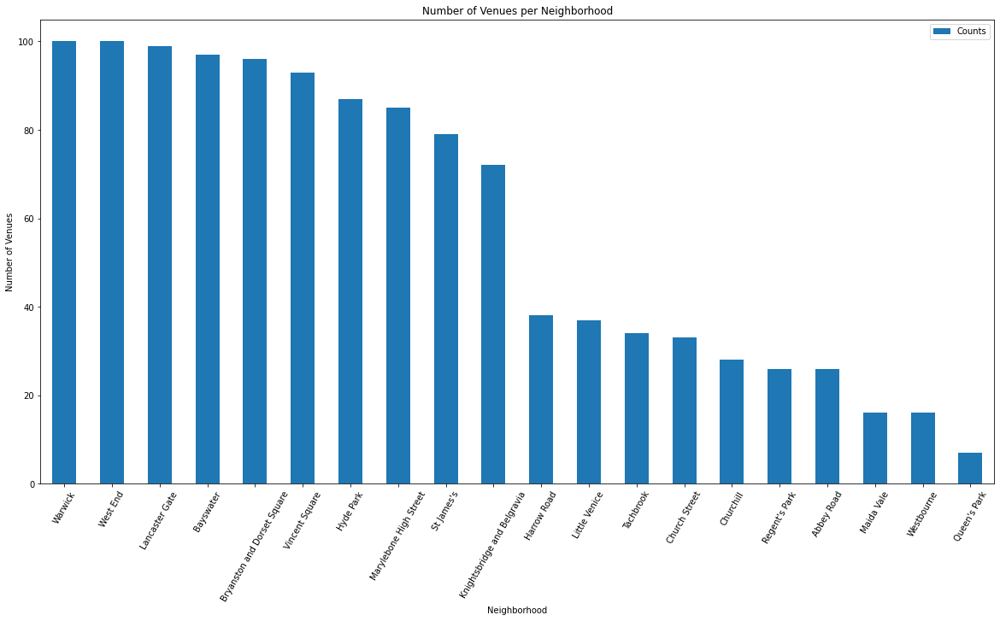

In [43]:
total_sort.plot(kind='bar', stacked=False, x="Neighborhood", y="Counts",figsize=(20, 10))
plt.title('Number of Venues per Neighborhood')
plt.ylabel('Number of Venues')
plt.xlabel('Neighborhood')
plt.xticks(rotation=60)
plt.show()

In [44]:
#the following codes add a nice image of London for the project notebook:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://www.tripsavvy.com/thmb/UW_qE8-8J3rs-Alv7Hu2iZt34uA=/3865x2576/filters:fill%28auto,1%29/palace-of-westminster-in-london-at-sunset--872038342-5b9b082b46e0fb00501f5ddd.jpg")

## 3.2 Sub-Analysis: Coffee Shops and Cafes in Westminster

We can see that the new 'westminster_venues' data frame has __1169 venues__ that are categorized into unique __193 categories__. The data frame also contains the geo location data for each of the venue.

Before I proceed further with clustering analysis to all of this data, I will create a subset of data from the 'westminster_venues' data frame in order to find out specifically about the number of coffee shops and the number of cafes in each neighborhood of Westminster. 

The purpose is to visualize the competitive landscape in each neighborhood. This sub analysis can provide useful insights about the decision-making process at a later stages, especially in the appearance of new other data.

#### 3.2.1 Create a data frame based on the 'Coffee Shop' & 'Cafe' venue categories in Westminster

In [45]:
#Count the number of Coffee Shop per Neighborhood in Westminster:
west1 = westminster_venues[westminster_venues['Venue Category'].str.contains('Coffee Shop', case=False, na=False)]
west12 = west1.drop(west1.columns[[1,2,4,5]], axis = 1) 
west12['Counts'] = west12.groupby(['Neighborhood'])['Venue Category'].transform('count')
west12 = west12.groupby(['Neighborhood','Counts'])['Venue'].unique().apply(', '.join).reset_index()
west12 = west12.sort_values(by='Counts', ascending=False)
#west12.reset_index(inplace = True) 

#display the full column values:
with pd.option_context('display.max_colwidth', None):
  display(west12)

,Neighborhood,Counts,Venue
2,Bryanston and Dorset Square,8,"Caffè Nero, Costa Coffee, Arro Coffee, Starbucks, The Borough Barista, Java U"
5,Hyde Park,8,"Mihbaj Cafe, Caffè Nero, Starbucks, Caffè Nero Express Bar, Costa Coffee"
12,Vincent Square,7,"Iris & June, Flat Cap Coffee Co, Formative, The Roasting, Coffee Addict, Rag & Bone, Caffè Nero"
7,Lancaster Gate,6,"Starbucks, Urban Baristas, Putera Puteri, Arro Coffee - the Temple of Coffee, Costa Coffee"
13,Warwick,6,"The Roasting, Ole & Steen, Coffee Addict, Starbucks, Black Sheep Coffee, Caffè Nero"
4,Harrow Road,4,"The Coffee Tree, Costa Coffee, Petit Café, Le Petit Venice"
6,Knightsbridge and Belgravia,4,"Starbucks, 39 Steps Coffee Haus, Caffè Nero, Nespresso Boutique"
0,Abbey Road,3,"Starbucks, Beatles Coffee Shop, The Coffee Shop"
3,Church Street,3,"d1, Costa Coffee, Starbucks"
15,Westbourne,3,"Costa Coffee, Naked Coffee @ Station, Le Petit Venice"


In [46]:
sum1 = west12['Counts'].sum()
print('There are {} Coffee Shops in Westminster area.'.format(sum1))

There are 63 Coffee Shops in Westminster area.


In [47]:
#Count the number of Cafe per Neighborhood in Westminster:
west2 = westminster_venues[westminster_venues['Venue Category'].str.contains('Café', case=False, na=False)]
west22 = west2.drop(west1.columns[[1,2,4,5]], axis = 1) 
west22['Counts'] = west22.groupby(['Neighborhood'])['Venue Category'].transform('count')
west22 = west22.groupby(['Neighborhood','Counts'])['Venue'].unique().apply(', '.join).reset_index()
west22 = west22.sort_values(by='Counts', ascending=False)

#display the full column values:
with pd.option_context('display.max_colwidth', None):
    display(west22)

,Neighborhood,Counts,Venue
6,Hyde Park,7,"Sandro Sandwich Bar, Darcie & May Green, Lena's Cafe, Leclerc & Laurent, Dylan Dog Cafe, Cafe Raffles, Dewan Cafe"
7,Knightsbridge and Belgravia,6,"L'ETO Caffè, EL&N, Carpo, Chapati & Karak, Katara"
8,Lancaster Gate,6,"Café Roma, Patisserie Valerie, Leclerc & Laurent, TAB x TAB, Churreria Española, La Parisienne Patisserie"
1,Bayswater,6,"TAB x TAB, Haminados, Churreria Española, Jusu Brothers, Patisserie Valerie, La Parisienne Patisserie"
9,Little Venice,5,"The Quince Tree, Raoul’s, Beany Green Coffee, Cafe Laville, Waterside Cafe"
16,Warwick,5,"Pimlico Fresh, Patisserie Valerie, Victoria Cafe, DDK's Cafe, Food Filosophy"
15,Vincent Square,5,"Regency Cafe, Pimlico Fresh, Patisserie Valerie, Caffe Grana, DDK's Cafe"
2,Bryanston and Dorset Square,4,"The Monocle Café, MyCircle Café, Patisserie Valerie, Loretta's"
12,Regent's Park,3,"Boulevard, Le Selma Bijou, Fego Caffe"
5,Harrow Road,3,"Maida Hill Cafe Gallery, Noamans Cafe, Sandro's Cafe"


In [48]:
sum2 = west22['Counts'].sum()
print('There are {} Cafés in Westminster area.'.format(sum2))

There are 64 Cafés in Westminster area.


#### 3.2.2 Merge the two data frames above with the data frame that contain coordinates data

In [49]:
df_combined = pd.merge(west12, west22, on = ['Neighborhood'], how = "inner") 
df_combined.rename(columns={'Neighborhood':'Neighborhood', 'Counts_x':'Coffee_Shops_Number','Venue_x':'Coffee_Shops_Names','Counts_y':'Cafes_Number','Venue_y':'Cafes_Names'},inplace=True)
df_merged = pd.merge(df3_west, df_combined, on = ['Neighborhood'], how = "left")

#It seems that West End ward doesn't have any coffee shop or cafe based on Foursquare API data
df_merged.fillna(0, inplace=True)
df_merged

,Neighborhood,Avg_Income,Latitude,Longitude,Coffee_Shops_Number,Coffee_Shops_Names,Cafes_Number,Cafes_Names
0,Abbey Road,"58,576.86",51.534412,-0.178185,3.0,"Starbucks, Beatles Coffee Shop, The Coffee Shop",2.0,"Cafe Med, Queen's Terrace Cafe"
1,Bayswater,"56,673.68",51.516727,-0.191849,2.0,"Arro Coffee - the Temple of Coffee, Costa Coffee",6.0,"TAB x TAB, Haminados, Churreria Española, Jusu..."
2,Bryanston and Dorset Square,"62,578.10",51.518843,-0.161807,8.0,"Caffè Nero, Costa Coffee, Arro Coffee, Starbuc...",4.0,"The Monocle Café, MyCircle Café, Patisserie Va..."
3,Church Street,"39,800.00",51.523680,-0.169851,3.0,"d1, Costa Coffee, Starbucks",2.0,"Roof Top Kitchen, Camden food co."
4,Churchill,"50,717.59",51.488757,-0.147685,0.0,0,0.0,0
5,Harrow Road,"47,554.90",51.526298,-0.197197,4.0,"The Coffee Tree, Costa Coffee, Petit Café, Le ...",3.0,"Maida Hill Cafe Gallery, Noamans Cafe, Sandro'..."
6,Hyde Park,"56,991.49",51.516236,-0.173652,8.0,"Mihbaj Cafe, Caffè Nero, Starbucks, Caffè Nero...",7.0,"Sandro Sandwich Bar, Darcie & May Green, Lena'..."
7,Knightsbridge and Belgravia,"56,530.63",51.499373,-0.158983,4.0,"Starbucks, 39 Steps Coffee Haus, Caffè Nero, N...",6.0,"L'ETO Caffè, EL&N, Carpo, Chapati & Karak, Katara"
8,Lancaster Gate,"60,712.74",51.512922,-0.185634,6.0,"Starbucks, Urban Baristas, Putera Puteri, Arro...",6.0,"Café Roma, Patisserie Valerie, Leclerc & Laure..."
9,Little Venice,"57,785.78",51.523944,-0.180025,2.0,"d1, Caffè Nero",5.0,"The Quince Tree, Raoul’s, Beany Green Coffee, ..."


#### 3.2.3 Result of Sub-Analysis

As I mentioned before, I will also pay attention to Cafe despite I am planning to analyze location to establish a coffee shop. The reason is because cafe is a close substitute for coffee shop. However, cafes are mostly focusing more on their food menus, while coffee shops focuses more on their beverage menus (coffee primarily). The sub-analysis has generated several key insights about the competitive landscape as follows:
- There are a total number of 212 coffee shops and cafes in all Westminster's neighborhoods,
- There are 97 Coffee shops that make up to 45.75% from the total number,
- There are 115 Cafes that make up to 54.25% from the total number,
- Both venue categories (coffee shops and cafes) make up to 18.14% of the total number of venues in Westminster,
- The top three neighborhoods with the largest number of coffee shops are Vincent's Square and Queens' Park with 8 coffee shops in each neighborhood, followed by Warwick with 7 coffee shops.
- The bottom three neighborhoods with the smallest number of coffee shops are Harrow Road and Westbourne with 1 cafe in each neighborhood, and followed by Knightsbridge and Belgravia with 3 coffee shops.
- The bottom three neighborhoods with the largest number of cafes are Regent's Park with 12 coffee shops, followed by Queens' Park with 10 coffee shops, and Maida Value with 9 coffee shops,
- The bottom three neighborhoods with the smallest number of cafes are Marylebone High Street and St. James' with 1 cafe in each neighborhood, and followed by Bryanston and Dorset Square with 2 cafes.

## 3.3 Visualization of the Result of the Sub-Analysis with Choropleth Map

#### Choropleth Map 3: Coffee Shops and Cafes in Westminster's Neighborhoods

In [50]:
west_geo = 'westminster_ward.geojson' # geojson file

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# create map
map_clusters = folium.Map(location=[lat, lng], zoom_start=12.5)

    
# generate choropleth map using the Number of Coffee Shops and Cafes in Westminster
map_clusters.choropleth(
    geo_data=west_geo,
    data=df_merged,
    columns=['Neighborhood','Coffee_Shops_Number'],
    key_on='properties.WD13NM',  #notes don't use the 'features.' part'
    fill_color='YlOrRd', 
    fill_opacity=0.5, 
    line_opacity=0.6,
    legend_name='Number of Coffee Shops in Westminster'
)

folium.LayerControl().add_to(map_clusters)

# add markers to map
for lat, lng, neighborhood, coffee, cofname, cafe, cafname in zip(df_merged['Latitude'], df_merged['Longitude'], 
                                        df_merged['Neighborhood'],
                                        df_merged['Coffee_Shops_Number'],
                                        df_merged['Coffee_Shops_Names'],
                                        df_merged['Cafes_Number'],
                                        df_merged['Cafes_Names']
                                       ):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup('Neighborhood (Ward): ' + str(neighborhood) + '\n'
                         + ' | Coffee Shop #: ' + str(coffee) 
                          + ' | Coffee Shop Names: ' + str(cofname) 
                         + ' | Cafes #: ' + str(cafe)
                          + ' | Cafes Names: ' + str(cafname) , parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=coffee,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_clusters)  

# display map
map_clusters

#### Screenshot to Choropleth Map 3

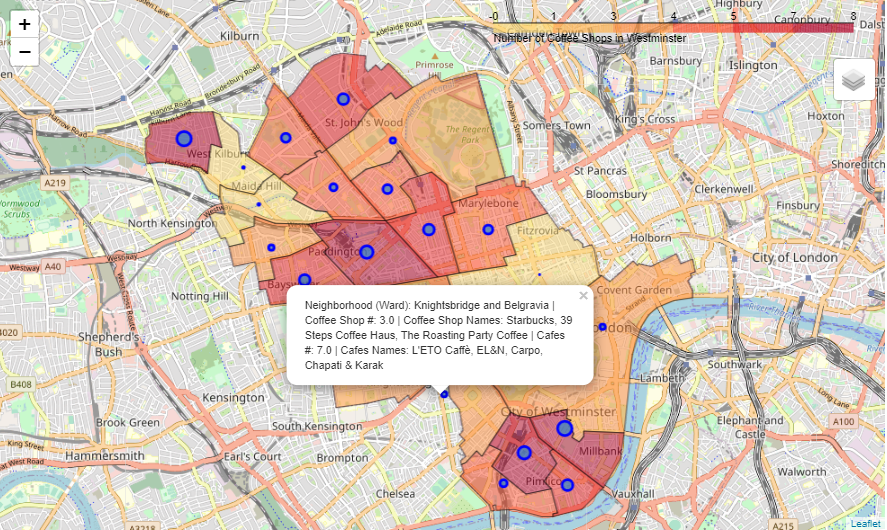

## 3.4 Find the Top 10 Venues in each Westminster's Neighborhood

#### 3.4.1 Use the 'One Hot Encoding': to display each venue category as features, then group them based on borough's name

In [51]:
# one hot encoding (change from westminster_coffee to venues)
westminster_onehot = pd.get_dummies(westminster_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
westminster_onehot['Neighborhood'] = westminster_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [westminster_onehot.columns[-1]] + list(westminster_onehot.columns[:-1])
westminster_onehot = westminster_onehot[fixed_columns]

westminster_onehot.head()

,Neighborhood,Accessories Store,African Restaurant,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,...,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Warehouse Store,Watch Shop,Whisky Bar,Wine Bar,Wine Shop,Women's Store,Yoga Studio
0,Abbey Road,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Abbey Road,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Abbey Road,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Abbey Road,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Abbey Road,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
westminster_grouped = westminster_onehot.groupby('Neighborhood').mean().reset_index()
westminster_grouped.head()

,Neighborhood,Accessories Store,African Restaurant,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,...,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Warehouse Store,Watch Shop,Whisky Bar,Wine Bar,Wine Shop,Women's Store,Yoga Studio
0,Abbey Road,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.038462,0.000000,0.000000,0.0,0.000000,0.000000,0.038462,0.000000,0.038462
1,Bayswater,0.0,0.010309,0.000000,0.0,0.020619,0.0,0.0,0.0,0.0,...,0.000000,0.010309,0.010309,0.000000,0.0,0.000000,0.010309,0.000000,0.000000,0.000000
2,Bryanston and Dorset Square,0.0,0.000000,0.010417,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.010417,0.0,0.010417,0.010417,0.000000,0.010417,0.010417
3,Church Street,0.0,0.000000,0.000000,0.0,0.030303,0.0,0.0,0.0,0.0,...,0.030303,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.030303
4,Churchill,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000


We use <code>shape</code> to see if the data frame has the same row number as the total number of boroughs in London, that is 33.

In [53]:
westminster_grouped.shape

(20, 194)

#### 3.4.2 Transform the data frame to obtain the normalized frequencies of coffee shop and cafe in each neighborhood

In [54]:
num_top_venues = 10

for hood in westminster_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = westminster_grouped[westminster_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abbey Road----
                       venue  freq
0                Coffee Shop  0.12
1              Deli / Bodega  0.08
2                       Café  0.08
3                Yoga Studio  0.04
4  Middle Eastern Restaurant  0.04
5             Pilates Studio  0.04
6         Persian Restaurant  0.04
7           Recording Studio  0.04
8             Sandwich Place  0.04
9          French Restaurant  0.04


----Bayswater----
                  venue  freq
0                 Hotel  0.11
1                   Pub  0.07
2                  Café  0.06
3           Pizza Place  0.05
4    Persian Restaurant  0.04
5  Gym / Fitness Center  0.04
6                Garden  0.04
7     Indian Restaurant  0.03
8        Sandwich Place  0.02
9             Juice Bar  0.02


----Bryanston and Dorset Square----
                       venue  freq
0  Middle Eastern Restaurant  0.08
1                Coffee Shop  0.08
2                      Hotel  0.06
3                       Café  0.04
4                     Bakery  0.0

#### 3.4.3 Create a function that will sort the rank of venue category per neighborhood

In [55]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

#### 3.4.5 Create a new data frame to contain the top 10 venues for each neighborhood

In [56]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = westminster_grouped['Neighborhood']

for ind in np.arange(westminster_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(westminster_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Road,Coffee Shop,Deli / Bodega,Café,Yoga Studio,Bakery,Pilates Studio,Pizza Place,Recording Studio,Sandwich Place,Middle Eastern Restaurant
1,Bayswater,Hotel,Pub,Café,Pizza Place,Garden,Persian Restaurant,Gym / Fitness Center,Indian Restaurant,Spa,Juice Bar
2,Bryanston and Dorset Square,Coffee Shop,Middle Eastern Restaurant,Hotel,Café,Pub,Restaurant,Bakery,Lebanese Restaurant,Gastropub,Grocery Store
3,Church Street,Coffee Shop,Middle Eastern Restaurant,Café,Grocery Store,Sandwich Place,Market,Lebanese Restaurant,Sports Bar,Bus Station,Snack Place
4,Churchill,Hotel,Italian Restaurant,Café,Garden,Bakery,Bar,Park,Pub,Restaurant,Farmers Market


## 3.5 Cluster the Boroughs

#### 3.5.1 Performing the K-Nearest Neighbors (k-NN) analysis

In [57]:
# import k-means from clustering stage
from sklearn.cluster import KMeans
# set number of clusters
kclusters = 2

westminster_grouped_clustering = westminster_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=None).fit(westminster_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1])

In [58]:
labels = kmeans.labels_
counts = np.bincount(labels[labels>=0])
top_labels = np.argsort(-counts)[:2]
top_labels

array([1, 0], dtype=int64)

#### 3.5.2 Label each neighborhood based on its cluster and the top 10 venues

In [59]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

#DONT FORGET TO UPDATE THIS ONE!
westminster_merged = df3_west

# merge westminster_grouped with westminster_data to add latitude/longitude for each neighborhood
westminster_merged = westminster_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

westminster_merged.head() # check the last columns!

,Neighborhood,Avg_Income,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Road,"58,576.86",51.534412,-0.178185,1,Coffee Shop,Deli / Bodega,Café,Yoga Studio,Bakery,Pilates Studio,Pizza Place,Recording Studio,Sandwich Place,Middle Eastern Restaurant
1,Bayswater,"56,673.68",51.516727,-0.191849,1,Hotel,Pub,Café,Pizza Place,Garden,Persian Restaurant,Gym / Fitness Center,Indian Restaurant,Spa,Juice Bar
2,Bryanston and Dorset Square,"62,578.10",51.518843,-0.161807,1,Coffee Shop,Middle Eastern Restaurant,Hotel,Café,Pub,Restaurant,Bakery,Lebanese Restaurant,Gastropub,Grocery Store
3,Church Street,"39,800.00",51.523680,-0.169851,1,Coffee Shop,Middle Eastern Restaurant,Café,Grocery Store,Sandwich Place,Market,Lebanese Restaurant,Sports Bar,Bus Station,Snack Place
4,Churchill,"50,717.59",51.488757,-0.147685,1,Hotel,Italian Restaurant,Café,Garden,Bakery,Bar,Park,Pub,Restaurant,Farmers Market


## 3.6 Plotting the Clusters

#### Choropleth Map 4: The Clusters of Westminster's Neighborhoods

In [60]:
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# create map
map_clusters = folium.Map(location=[lat, lng], zoom_start=12.5)

# generate choropleth map using the Number of Coffee Shops and Cafes in Westminster
map_clusters.choropleth(
    geo_data=west_geo,
    data=df_merged,
    columns=['Neighborhood','Coffee_Shops_Number'],
    key_on='properties.WD13NM',  #notes don't use the 'features.' part'
    fill_color='YlOrRd', 
    fill_opacity=0.3, 
    line_opacity=0.6,
    legend_name='Number of Coffee Shops in Westminster'
)

folium.LayerControl().add_to(map_clusters)
# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
#rainbow = ['red','purple','blue','green',]

# add markers to the map
markers_colors = ['red','purple','blue','green',]
for lat, lon, poi, cluster, ven1, ven2, ven3 in zip(westminster_merged['Latitude'], 
                                                    westminster_merged['Longitude'], 
                                                    westminster_merged['Neighborhood'], 
                                                    westminster_merged['Cluster Labels']
                                , westminster_merged['1st Most Common Venue']
                                , westminster_merged['2nd Most Common Venue']
                                , westminster_merged['3rd Most Common Venue']):
    label = folium.Popup('Cluster: ' + str(cluster + 1) +' | Borough Name: ' + str(poi) +' | Top 3 venues: ' +
                         '1. ' + str(ven1) + ', 2. ' + str(ven2) + ', 3. ' + str(ven3), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.9).add_to(map_clusters)
       
map_clusters

#### Screenshot to Choropleth Map 4

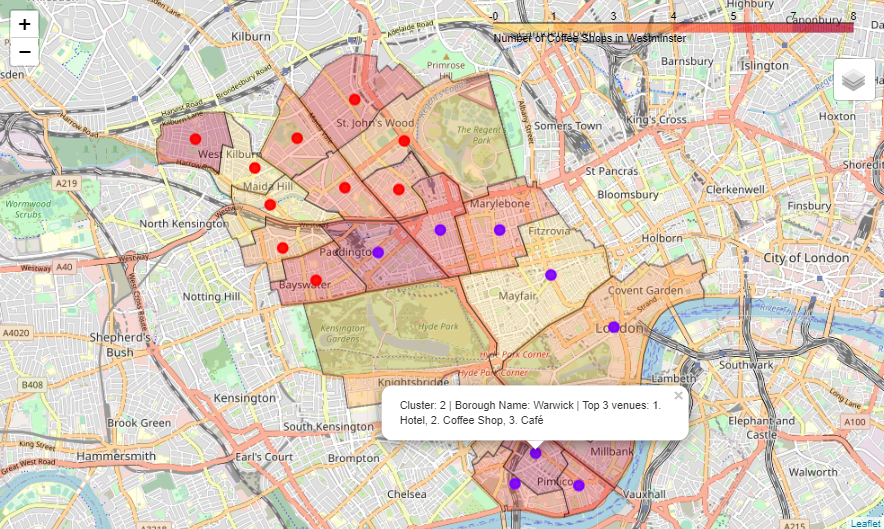

## 3.7 Evaluate the Cluster

#### 3.7.1 The Elbow Method

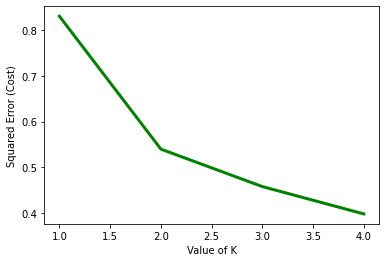

In [61]:
cost =[] 
westminster_grouped_clustering = westminster_grouped.drop('Neighborhood', 1)

for i in range(1, 5): 
    KM = KMeans(n_clusters = i, max_iter = 1000) 
    KM.fit(westminster_grouped_clustering) 
      
    # calculates squared error 
    # for the clustered points 
    cost.append(KM.inertia_)      
  
# plot the cost against K values 
plt.plot(range(1, 5), cost, color ='g', linewidth ='3') 
plt.xlabel("Value of K") 
plt.ylabel("Squared Error (Cost)") 
plt.show() # clear the plot 
  
# the point of the elbow is the  
# most optimal value for choosing k 

In [62]:
from scipy.spatial.distance import cdist 
westminster_grouped_clustering = westminster_grouped.drop('Neighborhood', 1)
X = westminster_grouped_clustering 

distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,10) 
  
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(X) 
    kmeanModel.fit(X)     
      
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / X.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / X.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 

In [63]:
for key,val in mapping1.items(): 
    print(str(key)+' : '+str(val)) 

1 : 0.18218046817622702
2 : 0.15344870691458262
3 : 0.14237359255651866
4 : 0.1256287754430318
5 : 0.1128817165629071
6 : 0.10826701062051988
7 : 0.09584855033405734
8 : 0.0846472999675644
9 : 0.0812236441376522


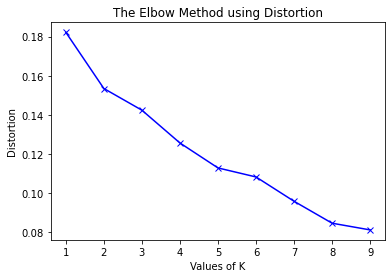

In [64]:
plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show() 

In [65]:
for key,val in mapping2.items(): 
    print(str(key)+' : '+str(val)) 

1 : 0.8299465818932746
2 : 0.5398098415059196
3 : 0.4549863446215009
4 : 0.39189140125051763
5 : 0.3317367021336122
6 : 0.2835825480308355
7 : 0.23844542812952885
8 : 0.20893359709274067
9 : 0.1793150841188869


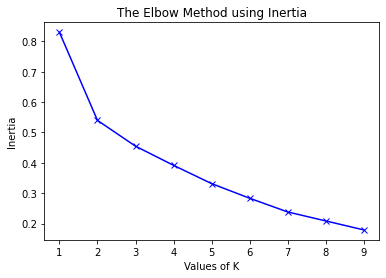

In [66]:
plt.plot(K, inertias, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show() 

#### 3.7.2 The Affinity Propagation Method

C:\Users\pythonnarrowjim\anaconda3\lib\site-packages\sklearn\cluster\_affinity_propagation.py:146: FutureWarning: 'random_state' has been introduced in 0.23. It will be set to None starting from 0.25 which means that results will differ at every function call. Set 'random_state' to None to silence this warning, or to 0 to keep the behavior of versions <0.23.
  warnings.warn(("'random_state' has been introduced in 0.23. "


Estimated number of clusters: 2
Homogeneity: 0.591
Completeness: 1.000
V-measure: 0.743
Adjusted Rand Index: 0.565
Adjusted Mutual Information: 0.724
Silhouette Coefficient: 0.725


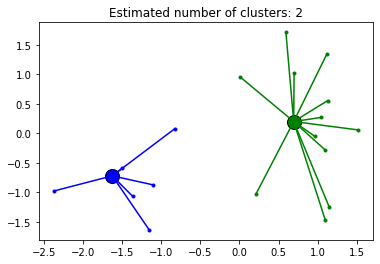

In [67]:
from sklearn.cluster import AffinityPropagation
from sklearn import metrics
from sklearn.datasets import make_blobs

westminster_grouped_clustering = westminster_grouped.drop('Neighborhood', 1)
X = westminster_grouped_clustering 

# #############################################################################
# Generate sample data, insert the number of neighborhoods as sample
centers = [[1, 1], [-1, -1], [1, -1]]
X, labels_true = make_blobs(n_samples=20, centers=centers, cluster_std=0.5,
                            random_state=None)

# #############################################################################
# Compute Affinity Propagation
af = AffinityPropagation(preference=-20).fit(X)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_

n_clusters_ = len(cluster_centers_indices)

print('Estimated number of clusters: %d' % n_clusters_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(labels_true, labels))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(labels_true, labels))
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels, metric='sqeuclidean'))

# #############################################################################
# Plot result
import matplotlib.pyplot as plt
from itertools import cycle

plt.close('all')
plt.figure(1)
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    class_members = labels == k
    cluster_center = X[cluster_centers_indices[k]]
    plt.plot(X[class_members, 0], X[class_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
    for x in X[class_members]:
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

#### 3.7.3 Examine each individual clusters

#### Cluster 1

In [68]:
westminster_merged.loc[westminster_merged['Cluster Labels'] == 0, westminster_merged.columns[[0] + list(range(5, westminster_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
12,Queen's Park,Gym,Yoga Studio,Italian Restaurant,Garden,Department Store,Fabric Shop,Food Truck,Food Court,Food & Drink Shop,Flower Shop


#### Cluster 2

In [69]:
westminster_merged.loc[westminster_merged['Cluster Labels'] == 1, westminster_merged.columns[[0] + list(range(5, westminster_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Road,Coffee Shop,Deli / Bodega,Café,Yoga Studio,Bakery,Pilates Studio,Pizza Place,Recording Studio,Sandwich Place,Middle Eastern Restaurant
1,Bayswater,Hotel,Pub,Café,Pizza Place,Garden,Persian Restaurant,Gym / Fitness Center,Indian Restaurant,Spa,Juice Bar
2,Bryanston and Dorset Square,Coffee Shop,Middle Eastern Restaurant,Hotel,Café,Pub,Restaurant,Bakery,Lebanese Restaurant,Gastropub,Grocery Store
3,Church Street,Coffee Shop,Middle Eastern Restaurant,Café,Grocery Store,Sandwich Place,Market,Lebanese Restaurant,Sports Bar,Bus Station,Snack Place
4,Churchill,Hotel,Italian Restaurant,Café,Garden,Bakery,Bar,Park,Pub,Restaurant,Farmers Market
5,Harrow Road,Coffee Shop,Café,Grocery Store,Pizza Place,Lebanese Restaurant,Pub,Middle Eastern Restaurant,Hotel,Mediterranean Restaurant,General Entertainment
6,Hyde Park,Hotel,Coffee Shop,Café,Italian Restaurant,Indian Restaurant,Pub,Garden,Outdoor Sculpture,Beer Bar,Thai Restaurant
7,Knightsbridge and Belgravia,Hotel,Café,Coffee Shop,Boutique,Italian Restaurant,Pizza Place,Indian Restaurant,Jewelry Store,Lebanese Restaurant,Middle Eastern Restaurant
8,Lancaster Gate,Hotel,Coffee Shop,Café,Pub,Chinese Restaurant,Greek Restaurant,Gym / Fitness Center,Pizza Place,Malay Restaurant,Garden
9,Little Venice,Pub,Café,Coffee Shop,Middle Eastern Restaurant,Lebanese Restaurant,French Restaurant,Bar,Pizza Place,Movie Theater,Moroccan Restaurant


## 3.8 Discussion: Result of the Cluster Analysis

#### Result Overview:
Okay, so based on the result of the previous two analysis (number of workday population and number of active businesses), I have already decided to pick Westminster as the potential area to establish the future coffee shop. In the next step, I increase the granular level of the analysis and ask a question such as: "which neighborhood in Westminster that is ideal to open a coffee shop?". 

There are __20 neighborhoods (wards)__ in the borough of Westminster. Before we choose a particular neighborhood, it is a very good idea to determine the attractiveness of each neighborhood first. We can perform this type of analysis by processing the incoming data from the Foursquare API to check what types or venues that are available in each neighborhood. 

Considering the limit of the Foursquare API, I can only retrieve a maximum of 100 venues per neighborhood. From the total of 1169 venues throughout Westminster, we can see that there are two neighborhood that reached the limit of venues, they are __Warwick__ and __West End__. Lancaster Gate closely behind with 99 venues. On the flip side, the data shows that Queens' Park has the lowest number of venues. In my own opinion, this is caused by the neighborhood area is mainly consist of residentials. 

#### Cluster Analysis:
The the type of machine learning algorithm used in this analysis is the 'unsupervised learning' algorithm. Specifically, I used the k-nearest neighbors algorithm (k-NN), which is a non-parametric classification, to classify the neighborhoods in Westminster into cluster areas. It is a predictive classification problems, so k-NN is appropriate for this task. 

I started with 'k' value = 3 to classify the neighborhood into 3 clusters. After I obtain the result, I ran it into two cluster evaluation methods:
1. The Elbow Method, using 'distortion' and 'inertia', and
2. The Affinity Propagation Method.

The elbow method used that the optimal value for k (#clusters) is 2. The affinity propagation method also shows the same result with optimum k value equals to 2. Afterwards, I ran the k-NN once again, but this time I use the value of k = 2. I plot the result in a choropleth map (Choropleth Map 4: 'The Clusters of Westminster Neighborhoods') that shows the color intensity based on the number of coffee shops in each neighborhood. The clusters of neighborhoods are superimposed on the map a layer above. The cluster members are as follows:

- Cluster 1: Abbey Road, Bayswater, Church Street, Harrow Road, Lancaster Gate, Little Venice, Maida Vale, Queens' Park, Regent's Park, and Westbourne.
- Cluster 2: Bryanston and Dorset Square, Churchill, Hyde Park, Knightsbridge and Belgravia, Marylebone High Street, St James's, Tachbrook, Vincent Square, Warwick, and West End.

From cluster examination, I can a clear characteristics from each cluster. Cluster 1(0) is dominated by the pubs and cafes that make up the first and second most common venues, while cluster 2 is dominated by the hotels and coffee shops as the first and second most common venues. If we examine the choropleth map 4 further, we can see that the clusters divided the Westminster borough approximately in 'half'.

Our focus of analysis is to find a location that is suited for a coffee shop. In this case we will be focusing on the cluster 2 since tcoffee shops have more presence in this cluster. The cluster marks on the cloropleth map 4 also tells us an interesting fact that coffee shop is situated much closer to the office area within Westminster neighborhood such as in St. James, Vincent Square and Mayfair. Other than office area, we can also see government offices and tourist destinations also mainly located in cluster 2 in Westminster. Hence this result findings confirms our initial target market/customers: office employees and government workers, as well as tourists and the local population.

# 4. Conclusion

Finding the perfect location to set up or invest in a business is a critical step that will contribute to the business future success. In this project, I began with a hypotesis-like statement that the coffee shop will target several types of customers (employees, gov't workers, tourists, locals), this determine what kind of data or parameters that will be used in the analysis. Accordingly, the analysis is performed to find a suitable location based on these specified criteria. The result confirms the hypothesis, coffee shop thrive in areas where office spaces, government offices, and tourists destination are located or intersected. These types of areas have the most potential to generate potential customers in the future.

__Based on this result I recommend three neighborhood in Westminster to establish a coffee shop. These neighborhoods are: St. James, Vincent Square, Warwick, and Mayfair.__

# 5. References:

1. European Coffee Federation. European Coffee Report 2018-2019. Brussels : European Coffee Federation, 2019. p. 20, Market Report.
2. Wikipedia. London. San Fransisco : Wikimedia Foundation Inc., 2021.
3. Greater London Authority. Population Density (GLA Estimates/Projections). London : Greater London Authority, 2021.
4. www.doogal.co.uk. London Postcodes. 
5. Grange, Stuart. London Boroughs Boundaries. Zurich : Stuart Grange, 2021.
6. https://github.com/martinjc
7. pypi.org. geopy 2.1.0. 
8. Foursquare. Developers API. 2021.